#Notebook: Sustracción
###Por: Maria Camila Remolina Gutiérrez

En este notebook se realizan los 2 tipos de sustracción: imagen-coadición y 4D

In [2]:
%pylab inline
from astropy.io import fits
import os

Populating the interactive namespace from numpy and matplotlib


In [3]:
#Paths
path_coadicion = './data/coadicion/'
path_supernova = './data/supernova/'
path_visitas = './imagenes/visitas/'
path_sustraccion_img_coad = './imagenes/sustraccion_imagen_coadicion/'
path_sustraccion_4D = './imagenes/sustraccion_4D/'

#Coadicion

In [4]:
coadiciones = sort(os.listdir(path_coadicion))
print coadiciones

['coadicion.fits']


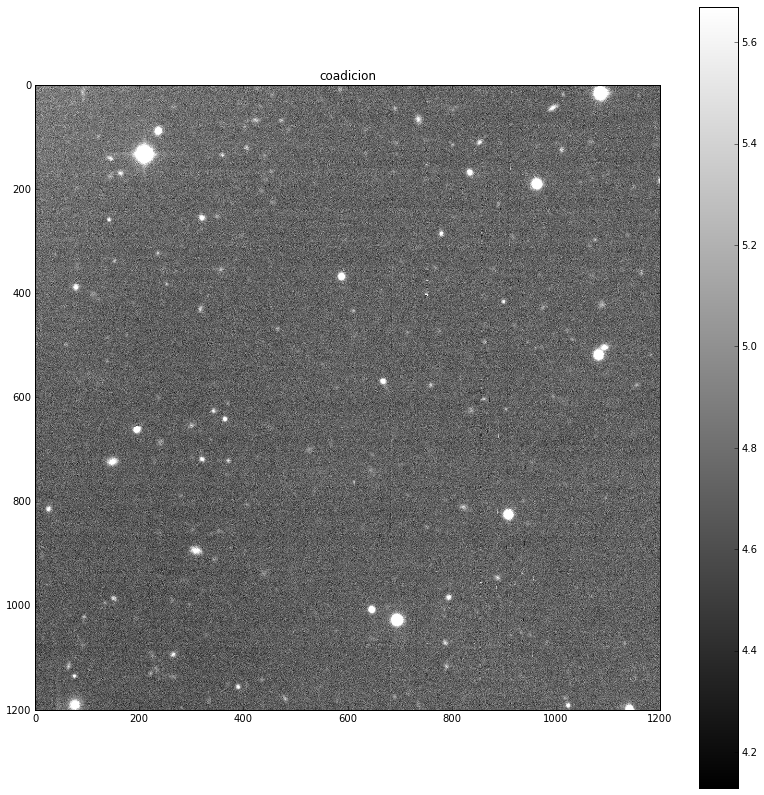

In [5]:
nombre_visita_coadicion = coadiciones[0]
visita_coadicion = fits.open(path_coadicion+nombre_visita_coadicion)
titulo = nombre_visita_coadicion.split('.')[0]

coadicion = visita_coadicion[1].data

fig = figure(figsize=(14,14))
imshow(coadicion, cmap='gray',vmin=4.13,vmax=5.67)
colorbar()
title(titulo)
savefig(path_visitas+titulo+'.png', bbox_inches='tight')
show()
close()

visita_coadicion.close()

#Supernova

In [6]:
supernovas = sort(os.listdir(path_supernova))
num_supernovas = len(supernovas)
print supernovas

['+1.fits' '+3.fits' '-1,2.fits' '-2,2.fits' '-3.fits' '-4.fits' '0.fits']


In [7]:
vmins = [5.7,7,6.1,6,11.5,10.9,9.2]
vmaxs = [7.4,9.2,7.9,7.6,13.8,13.3,11.3]

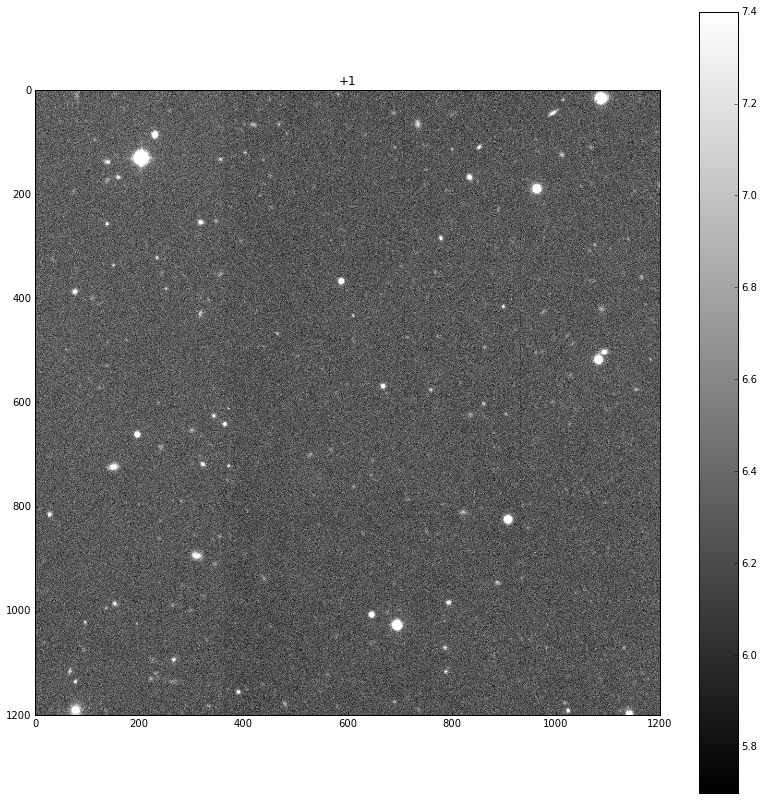

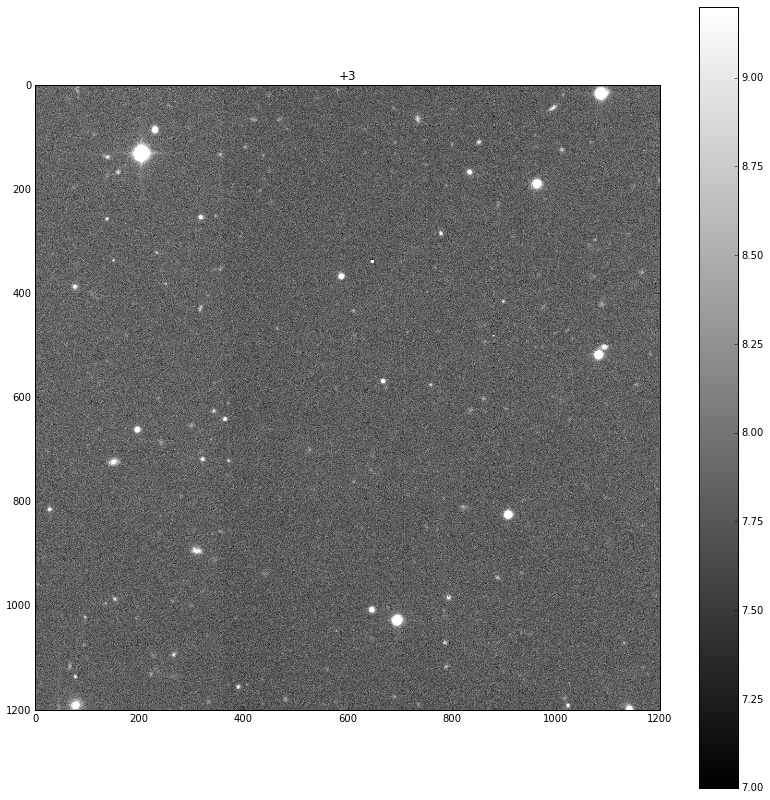

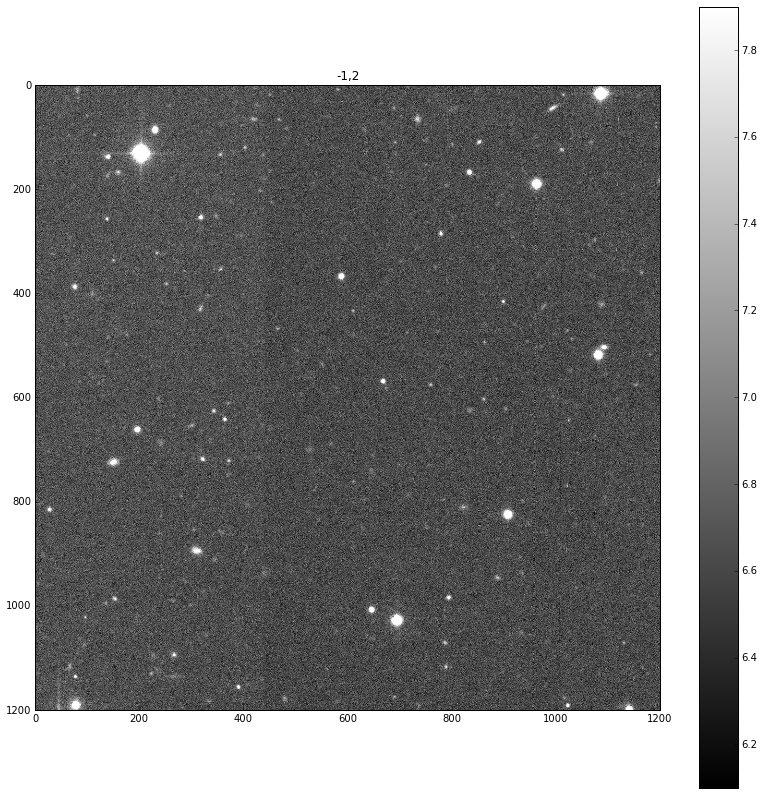

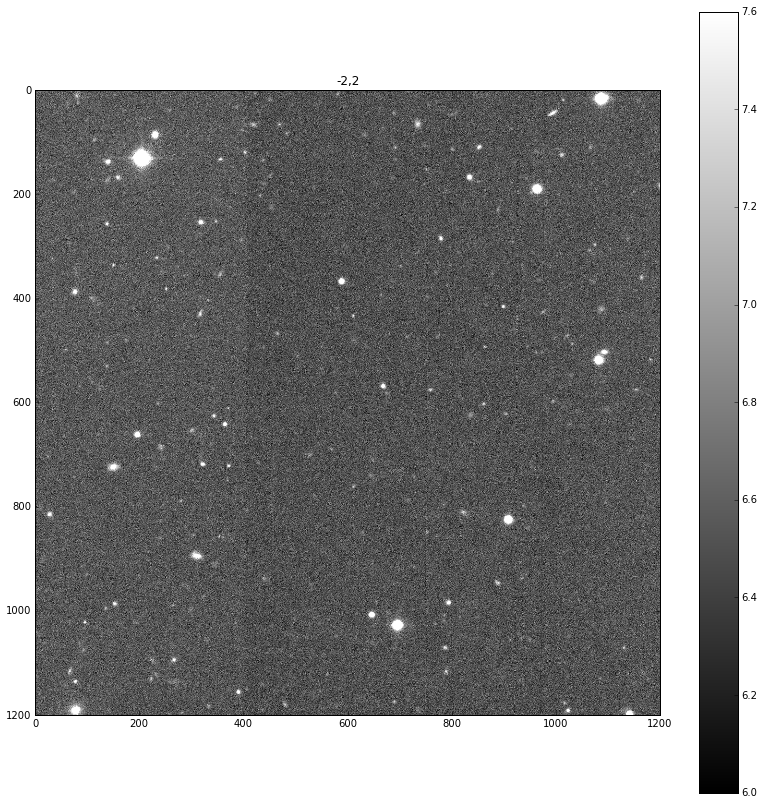

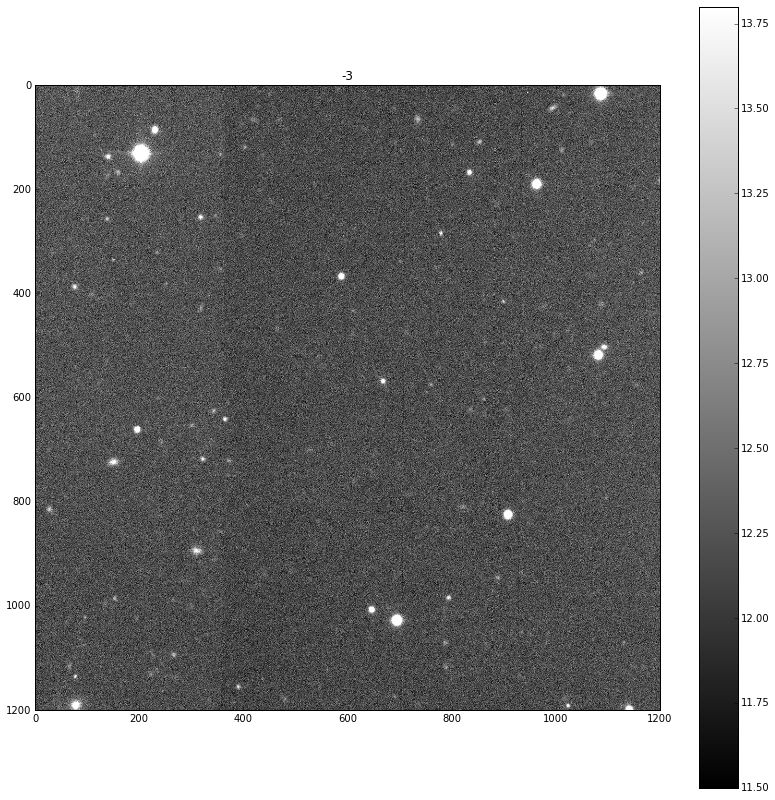

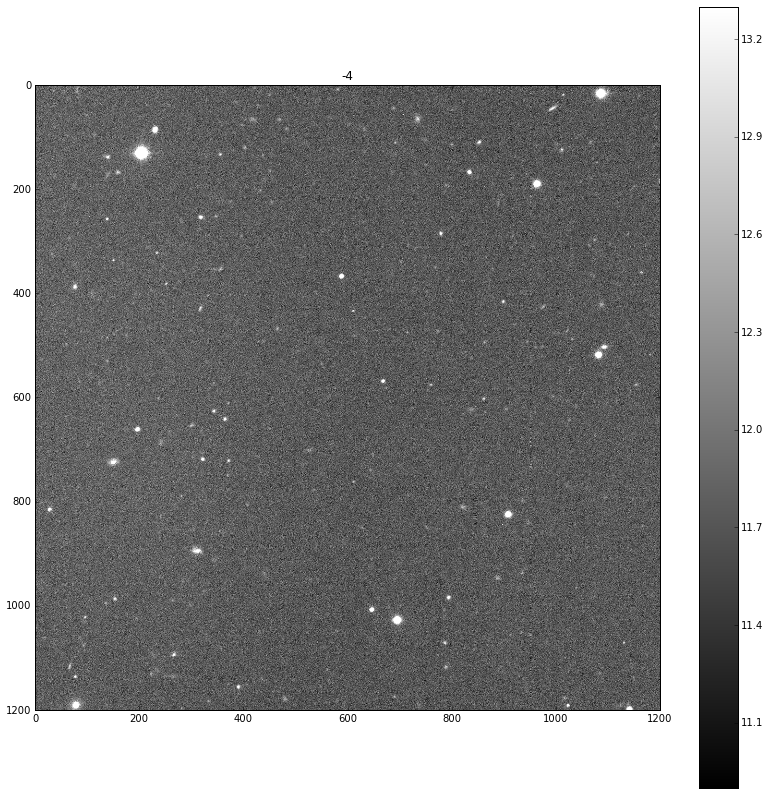

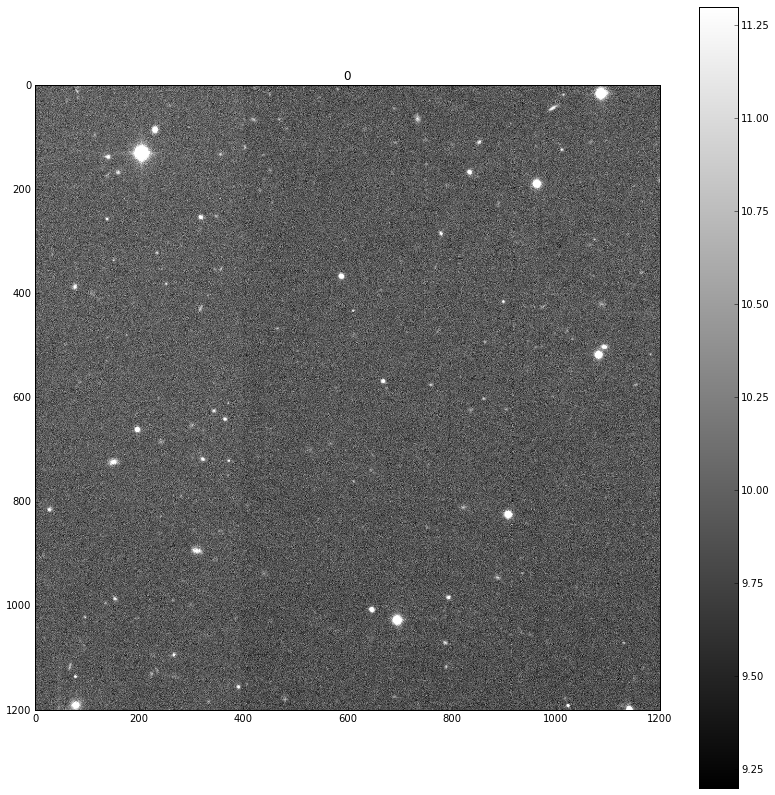

In [8]:
for i in range(num_supernovas): 
    
    nombre_visita_supernova = supernovas[i]
    visita_supernova = fits.open(path_supernova+nombre_visita_supernova)
    titulo = nombre_visita_supernova.split('.')[0]

    supernova_i = visita_supernova[1].data
        
    fig = figure(figsize=(14,14))
    imshow(supernova_i, cmap='gray',vmin=vmins[i],vmax=vmaxs[i])
    colorbar()
    title(titulo)
    savefig(path_visitas+titulo+'.png', bbox_inches='tight')
    show()
    close()
    
    visita_supernova.close()

In [9]:
shape_visitas = shape(supernova_i)
print shape_visitas

(1200, 1200)


#SUSTRACCION IMAGEN-COADICION

In [13]:
vmins = [0.45,1.88,0.93,0.85,6.60,5.78,4.18]
vmaxs = [2.39,4.38,3.17,2.78,9.22,7.90,6.12]

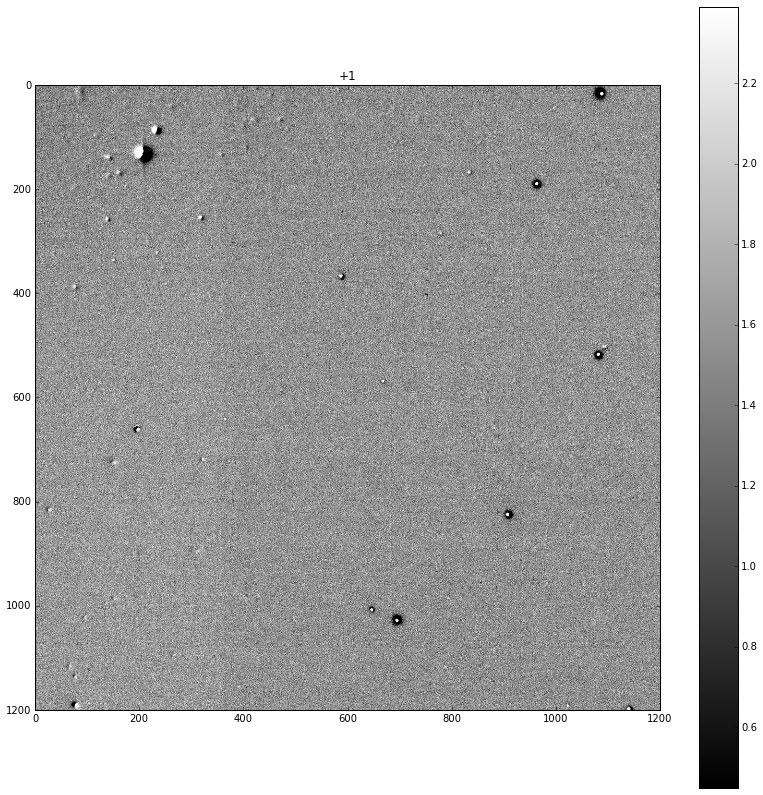

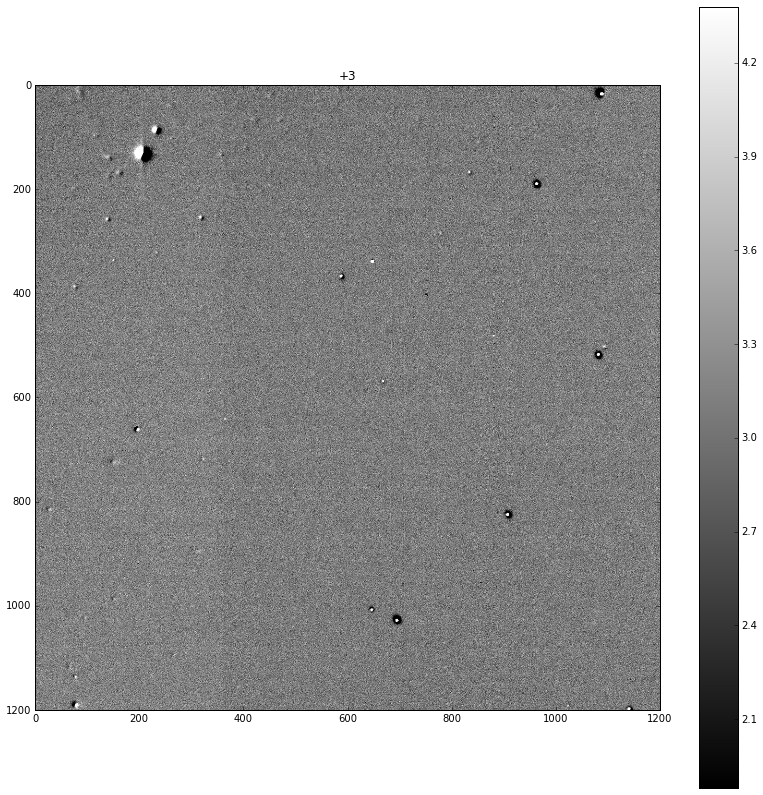

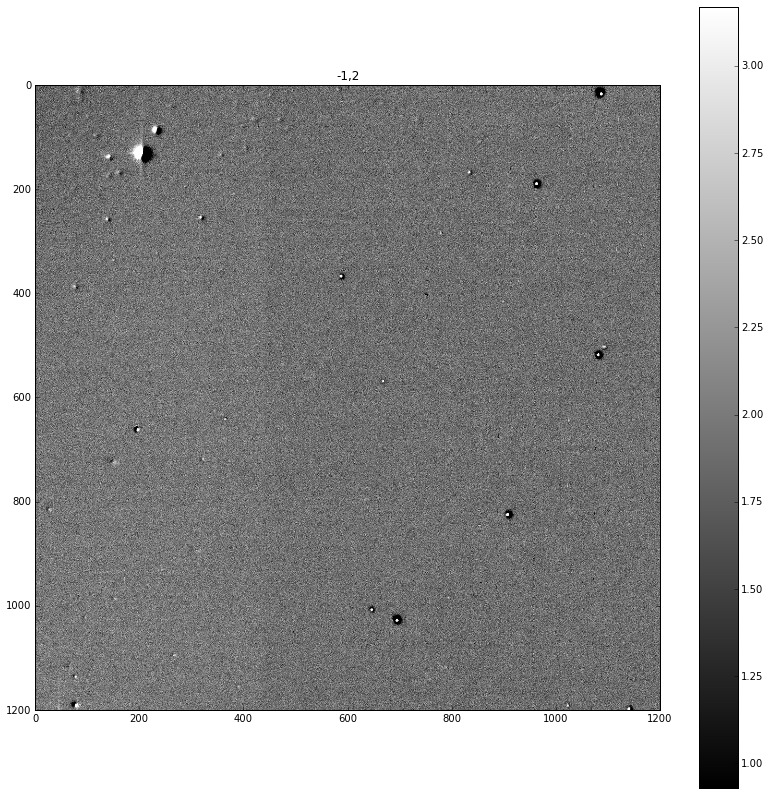

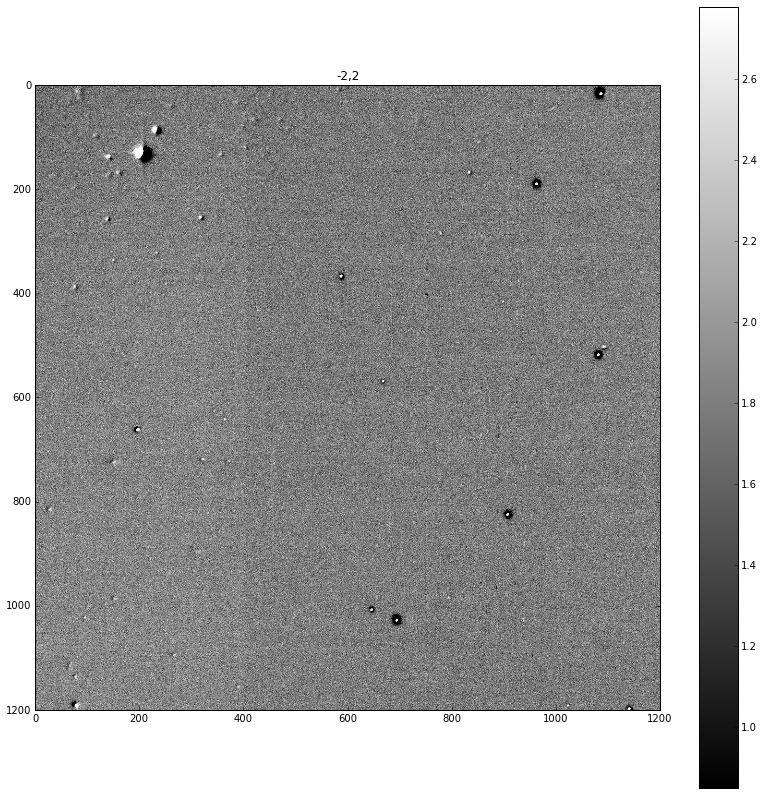

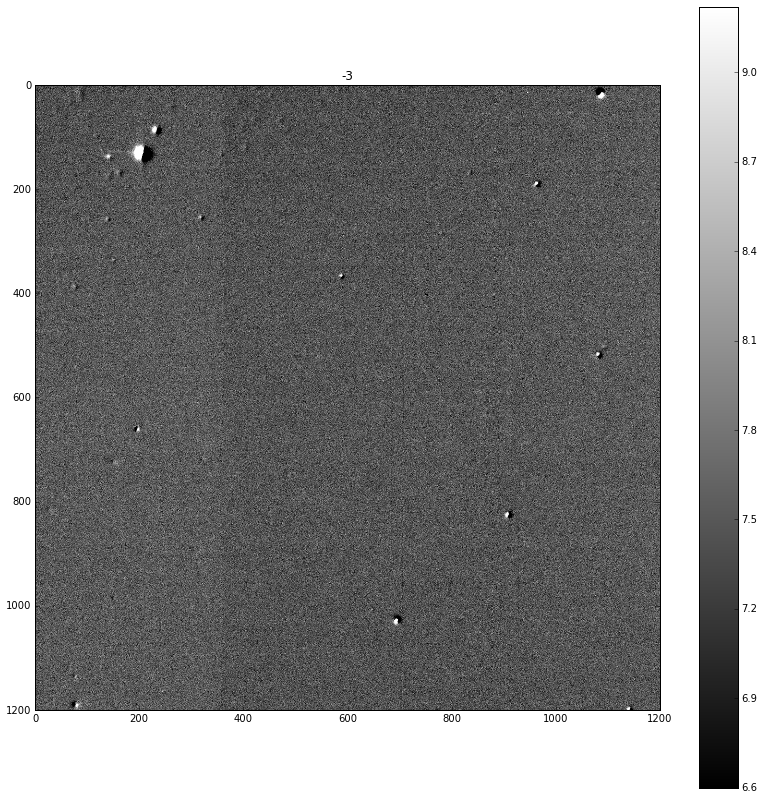

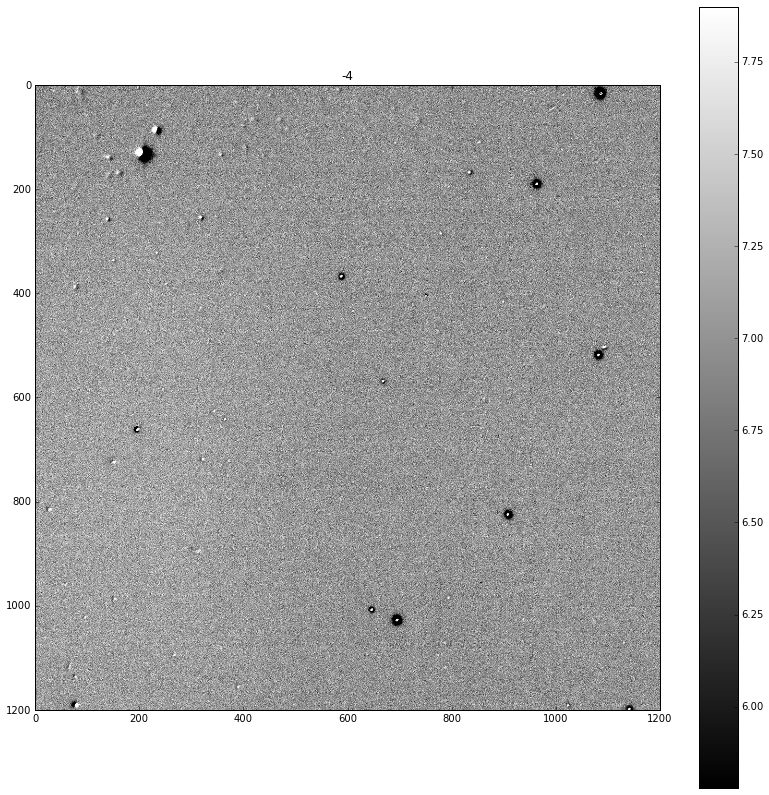

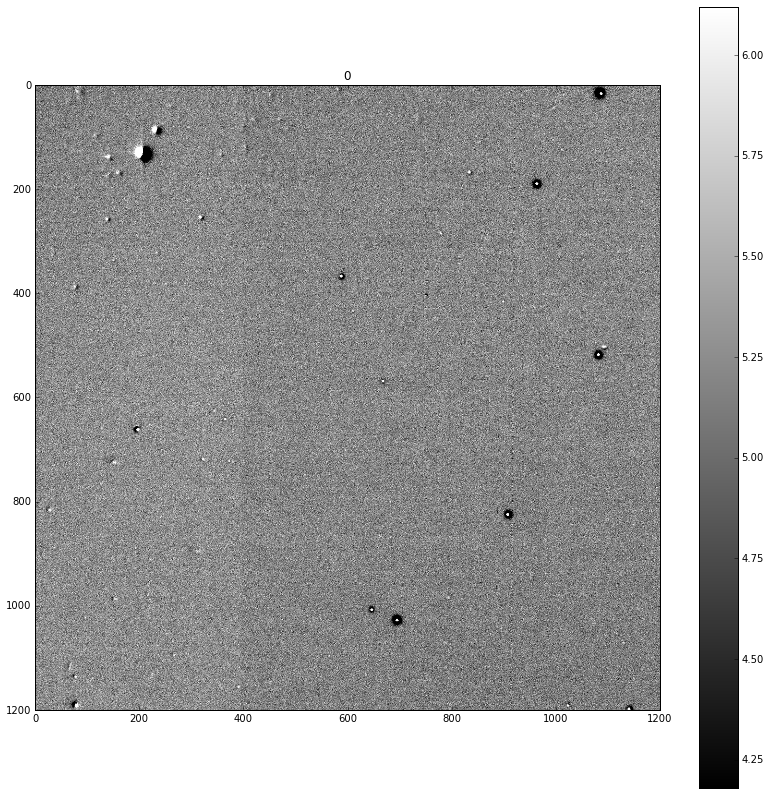

In [15]:
for i in range(num_supernovas): 
    
    nombre_visita_supernova = supernovas[i]
    visita_supernova = fits.open(path_supernova+nombre_visita_supernova)
    titulo = nombre_visita_supernova.split('.')[0]

    supernova_i = visita_supernova[1].data
    
    sustraccion_img_coad = supernova_i - coadicion
        
    fig = figure(figsize=(14,14))
    imshow(sustraccion_img_coad, cmap='gray',vmin=vmins[i],vmax=vmaxs[i])
    colorbar()
    title(titulo)
    savefig(path_sustraccion_img_coad+titulo+'.png', bbox_inches='tight')
    show()
    close()
    
    hdu = fits.PrimaryHDU(sustraccion_img_coad)
    hdu.writeto(path_sustraccion_img_coad+nombre_visita_supernova)
    
    visita_supernova.close()

#SUSTRACCION 4D 

In [32]:
visitas = concatenate(([path_supernova+supernova_fn for supernova_fn in supernovas],[path_coadicion+coadiciones[0]]))
print visitas

['./data/supernova/+1.fits' './data/supernova/+3.fits'
 './data/supernova/-1,2.fits' './data/supernova/-2,2.fits'
 './data/supernova/-3.fits' './data/supernova/-4.fits'
 './data/supernova/0.fits' './data/coadicion/coadicion.fits']


In [35]:
minimos = ones((shape_visitas[0], shape_visitas[1]))*inf
maximos = zeros((shape_visitas[0], shape_visitas[1]))

In [36]:
for i in range(len(visitas)): 
    
    nombre_visita = visitas[i]
    visita = fits.open(nombre_visita)

    visita_i = visita[1].data
    #visita_i = visita_i*60000/amax(visita_i) #para normalizar
    
    for fila in range(shape_visitas[0]):
        for columna in range(shape_visitas[1]):
            
            pixel = visita_i[fila][columna]
            
            if (pixel < minimos[fila][columna]):
                minimos[fila][columna] = pixel
            
            if (pixel > maximos[fila][columna]):
                maximos[fila][columna] = pixel
         
    visita.close() 

In [37]:
sustraccion4D = maximos-minimos

In [38]:
hdu = fits.PrimaryHDU(sustraccion4D)
hdu.writeto(path_sustraccion_4D+'sustraccion4D.fits') 

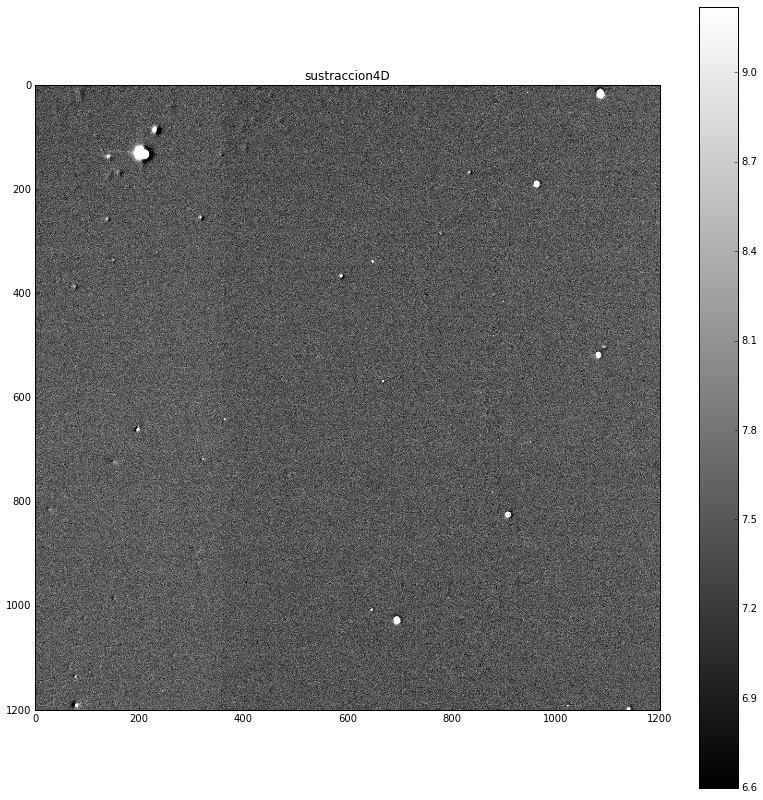

In [39]:
fig = figure(figsize=(14,14))
imshow(sustraccion4D, cmap='gray',vmin=6.6,vmax=9.22)
colorbar()
title('sustraccion4D')
savefig(path_sustraccion_4D+'sustraccion4D'+'.png', bbox_inches='tight')
show()
close()